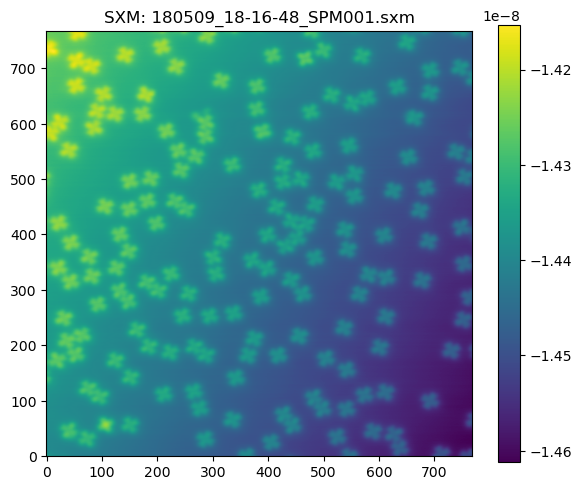

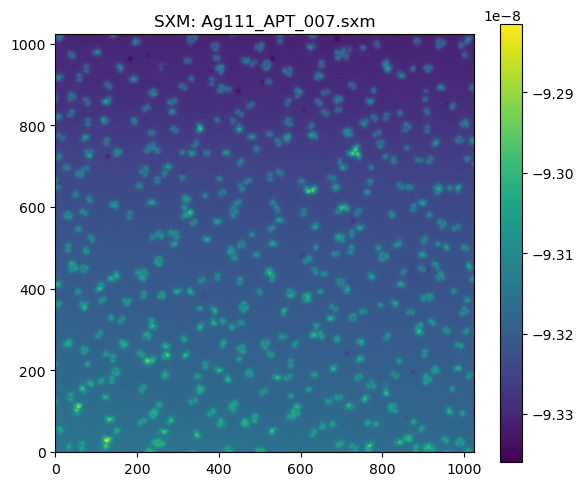

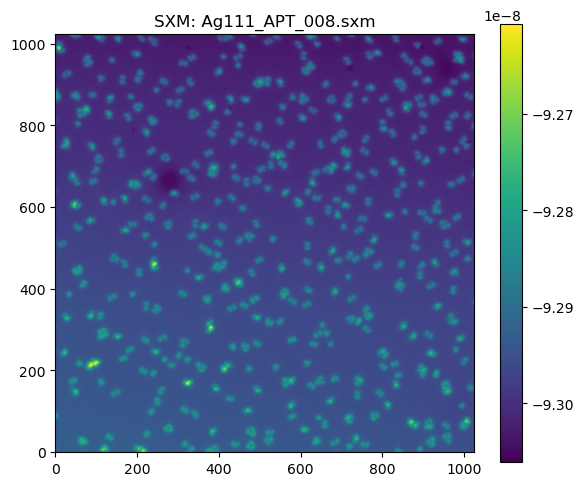

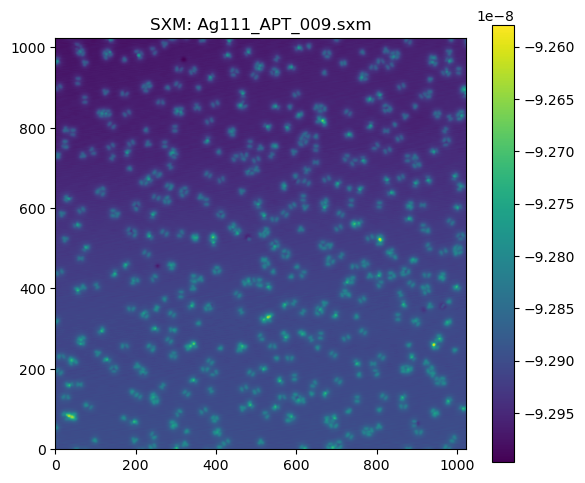

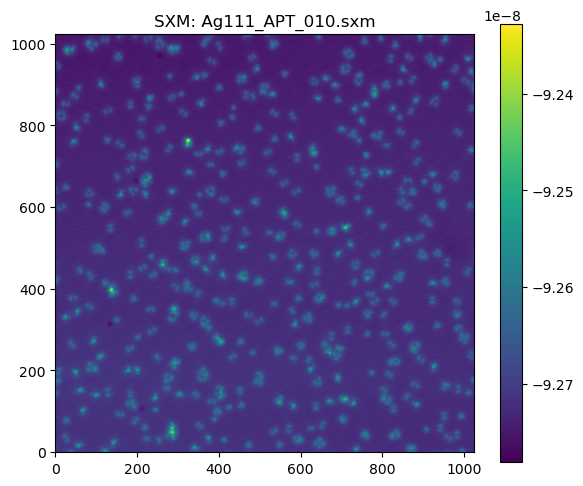

...

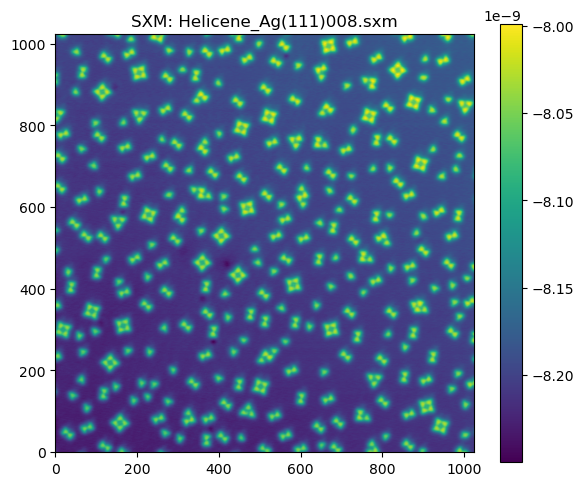

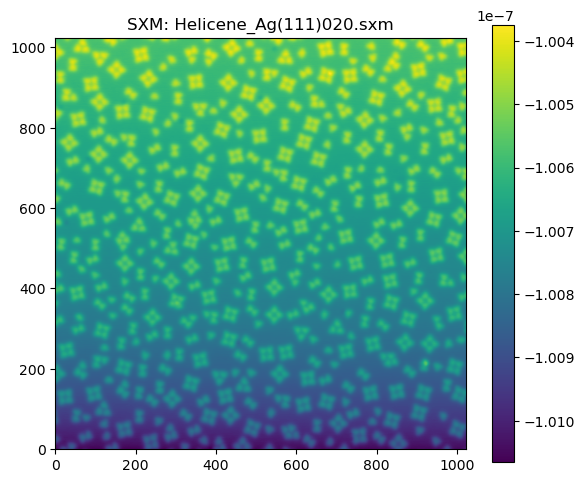

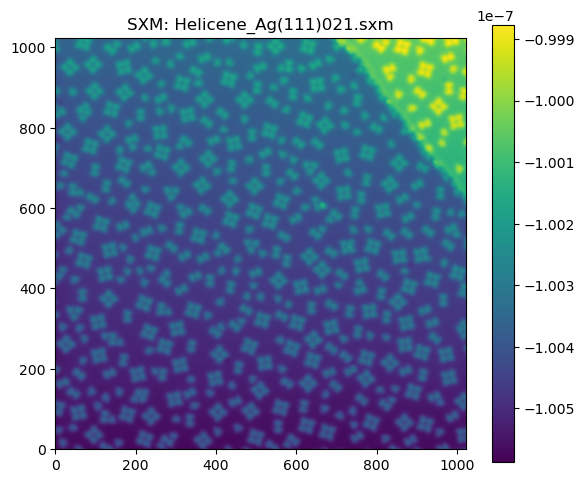

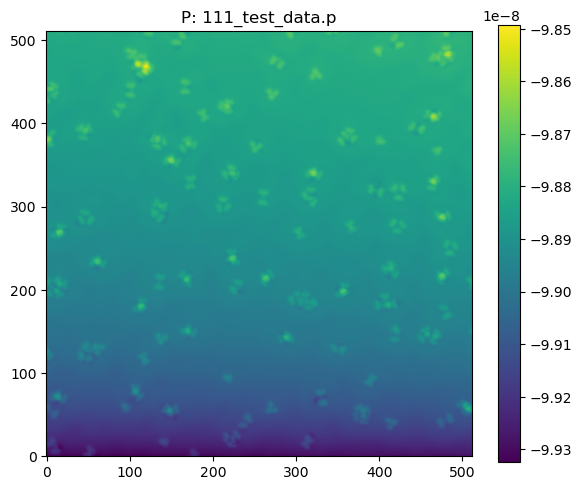

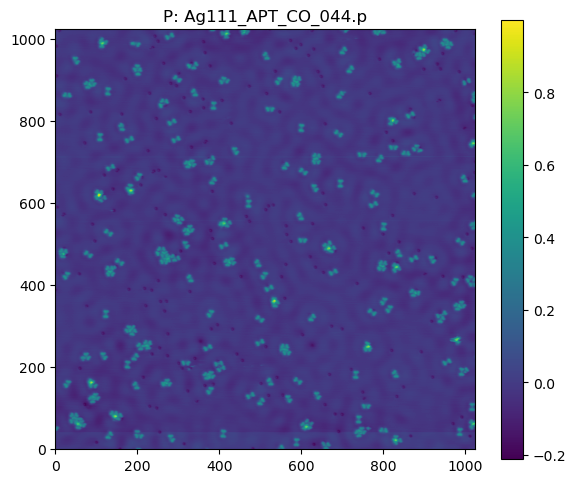

In [7]:
import os
import numpy as np
np.float = float
np.int = int
import matplotlib.pyplot as plt
import pickle

try:
    import nanonispy as nap
except ImportError:
    print("Install nanonispy first: pip install nanonispy")


# === Step 1: Define Directories ===
SXM_DIR = r'C:\Users\erlin\Downloads\ADS 2002\SXM files'
P_DIR = r'C:\Users\erlin\Downloads\ADS 2002\P files'

# === Step 2: File Lists ===
sxm_files = [f for f in os.listdir(SXM_DIR) if f.endswith('.sxm')]
p_files = [f for f in os.listdir(P_DIR) if f.endswith('.p')]

# === Step 3: Load SXM ===
def load_sxm(filepath, channel='Z'):
    scan = nap.read.Scan(filepath)
    if channel not in scan.signals:
        raise ValueError(f"Channel '{channel}' not found in {os.path.basename(filepath)}")
    
    image = scan.signals[channel]['forward']
    
    # Flip if needed
    if scan.header.get('scan_dir', '') == 'down':
        image = np.flipud(image)
    
    # Replace NaNs
    if np.isnan(image).any():
        image[np.isnan(image)] = np.nanmean(image)
    
    rescale = scan.header['scan_range'] / scan.header['scan_pixels']
    return image, rescale

# === Step 4: Load Pickled Files ===
def load_p_file(filepath):
    with open(filepath, 'rb') as f:
        data = pickle.load(f)
    image = data['image']
    rescale = data.get('rescale', 1)
    return image, rescale

# === Step 5: Parse All Files ===
sxm_data, p_data = [], []

for fname in sxm_files:
    path = os.path.join(SXM_DIR, fname)
    try:
        img, scale = load_sxm(path, channel='Z')  # You can change to 'Current'
        sxm_data.append({'name': fname, 'image': img, 'rescale': scale})
    except Exception as e:
        print(f"[SXM] Error reading {fname}: {e}")

for fname in p_files:
    path = os.path.join(P_DIR, fname)
    try:
        img, scale = load_p_file(path)
        p_data.append({'name': fname, 'image': img, 'rescale': scale})
    except Exception as e:
        print(f"[P] Error reading {fname}: {e}")

# === Step 6: Quick Viewer ===
def show_image(image, title='', cmap='viridis'):
    plt.figure(figsize=(6,5))
    plt.imshow(image, cmap=cmap, origin='lower')
    plt.title(title)
    plt.colorbar()
    plt.tight_layout()
    plt.show()

# === Step 7: View All or Batch ===
def view_all_images(dataset, prefix='SXM', max_images=10):
    for i, entry in enumerate(dataset):
        if i >= max_images:
            print(f"Displayed {max_images} images. (Total in dataset: {len(dataset)})")
            break
        show_image(entry['image'], title=f"{prefix}: {entry['name']}")

# === Call the viewer ===
view_all_images(sxm_data, prefix='SXM', max_images=len(sxm_data))
view_all_images(p_data, prefix='P', max_images=len(p_data))



# blob_log

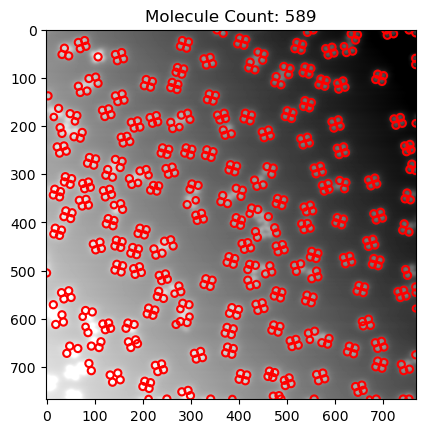

180509_18-16-48_SPM001.sxm → 589 molecules


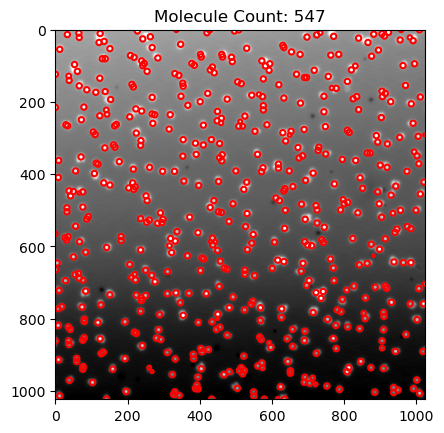

Ag111_APT_007.sxm → 547 molecules


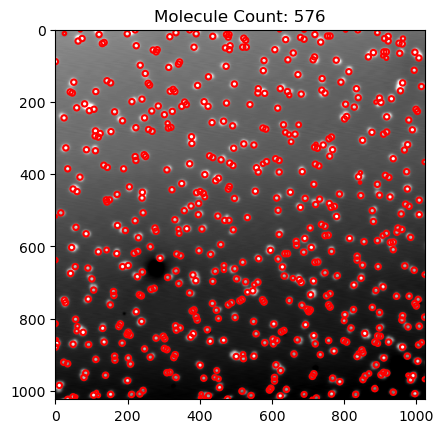

Ag111_APT_008.sxm → 576 molecules


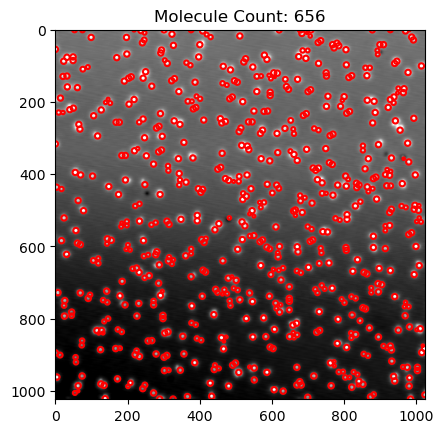

Ag111_APT_009.sxm → 656 molecules


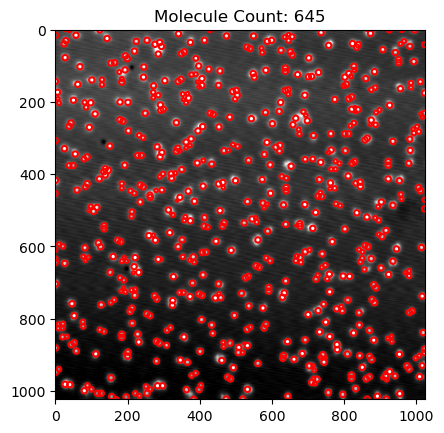

Ag111_APT_010.sxm → 645 molecules


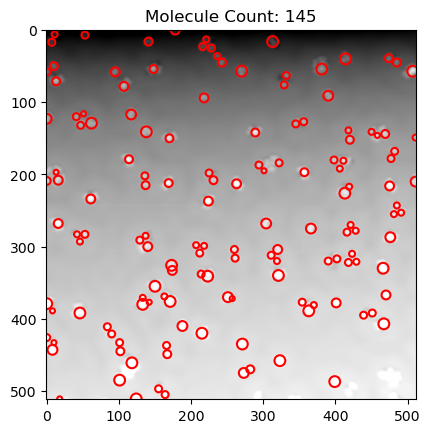

Ag111_APT_111.sxm → 145 molecules


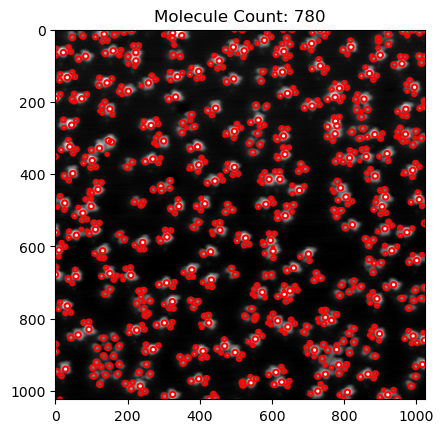

Ag111_APT_LL1s_UV9min_009.sxm → 780 molecules


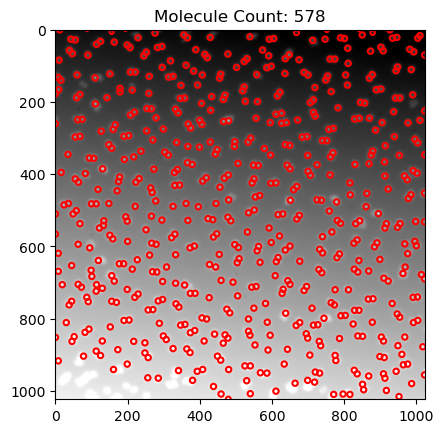

Ag111_APT_UV21min_anneal_003.sxm → 578 molecules


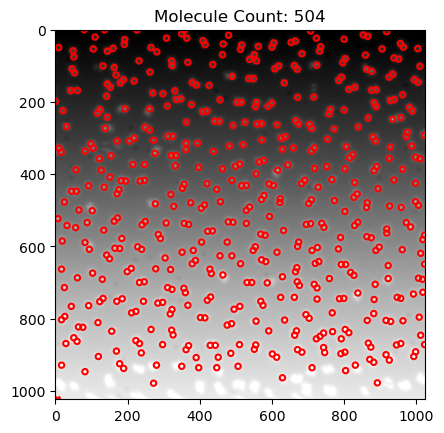

Ag111_APT_UV21min_anneal_40min_018.sxm → 504 molecules


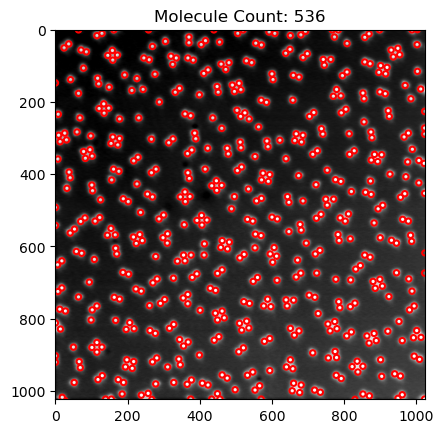

Helicene_Ag(111)008.sxm → 536 molecules


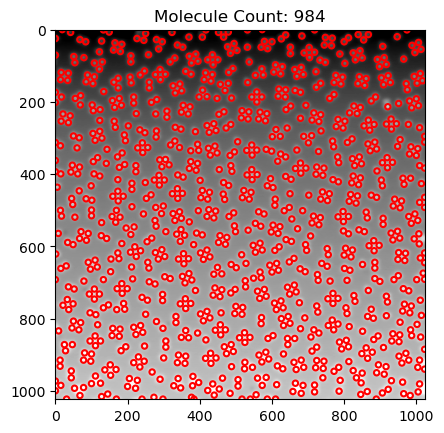

Helicene_Ag(111)020.sxm → 984 molecules


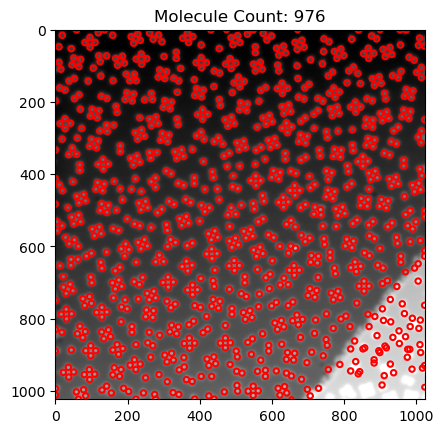

Helicene_Ag(111)021.sxm → 976 molecules


In [16]:
from scipy.ndimage import gaussian_filter

def preprocess_image(img, sigma=1):
    img = np.nan_to_num(img, nan=np.nanmean(img))
    img = gaussian_filter(img, sigma=sigma)
    vmin, vmax = np.percentile(img, [1, 99])
    img = np.clip(img, vmin, vmax)
    img = (img - vmin) / (vmax - vmin)  # normalize 0–1
    return img

from skimage.feature import blob_log

def count_molecules(img, min_sigma=1, max_sigma=5, threshold=0.05):
    blobs = blob_log(img, min_sigma=min_sigma, max_sigma=max_sigma, threshold=threshold)
    return blobs

def show_molecule_detection(img, blobs):
    fig, ax = plt.subplots()
    ax.imshow(img, cmap='gray')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r * 1.5, color='red', linewidth=1.5, fill=False)
        ax.add_patch(c)
    ax.set_title(f"Molecule Count: {len(blobs)}")
    plt.show()

for entry in sxm_data:
    img = preprocess_image(entry['image'])
    blobs = count_molecules(img)
    show_molecule_detection(img, blobs)
    print(f"{entry['name']} → {len(blobs)} molecules")


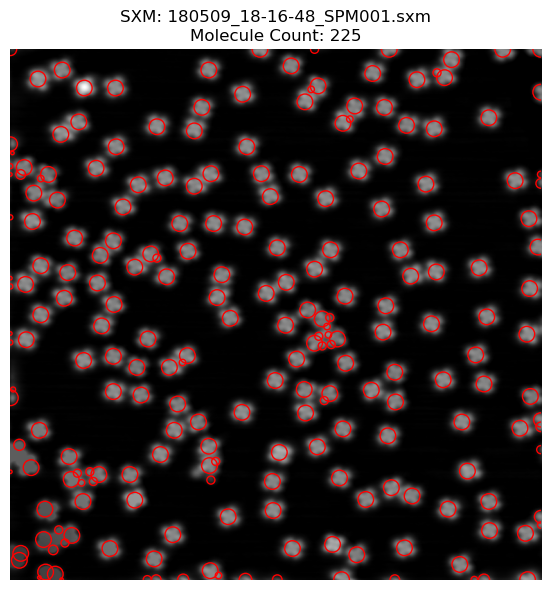

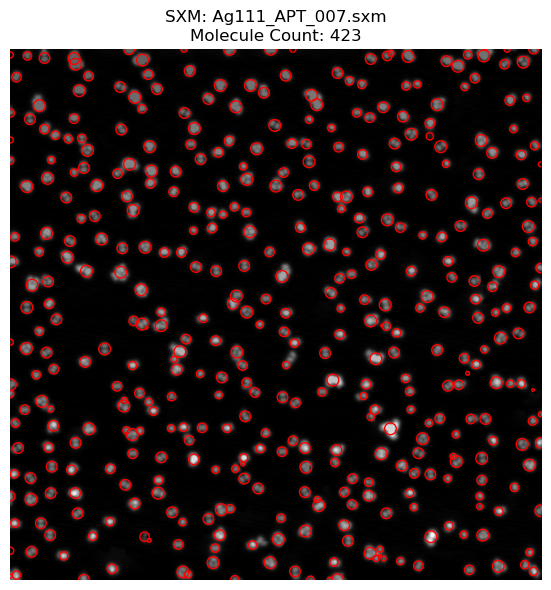

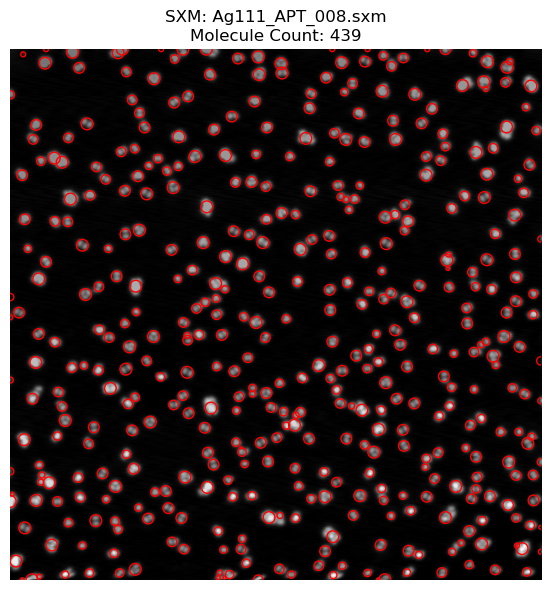

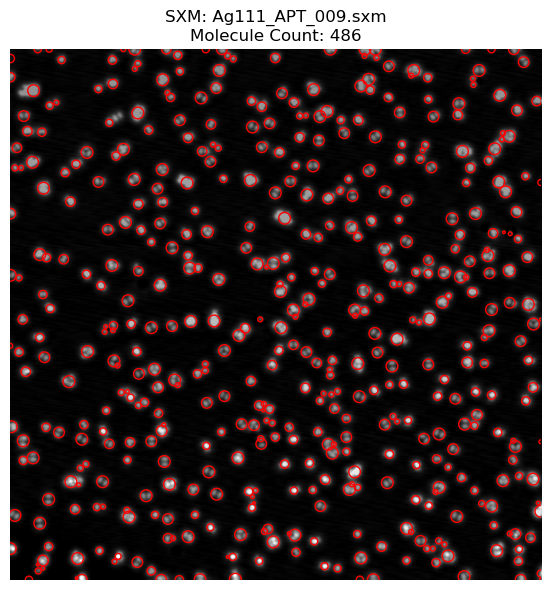

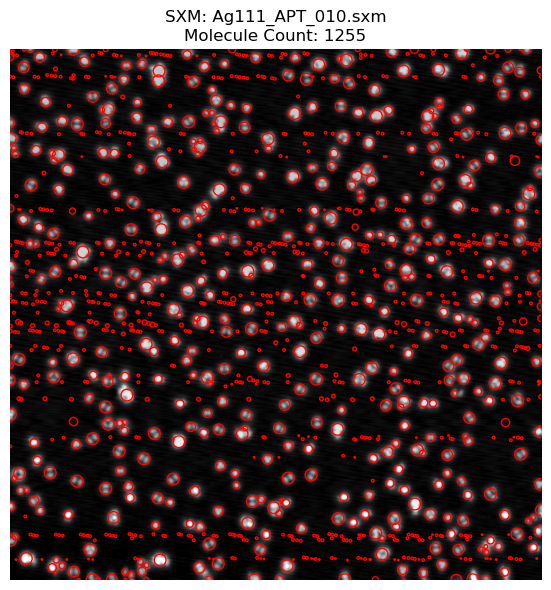

...

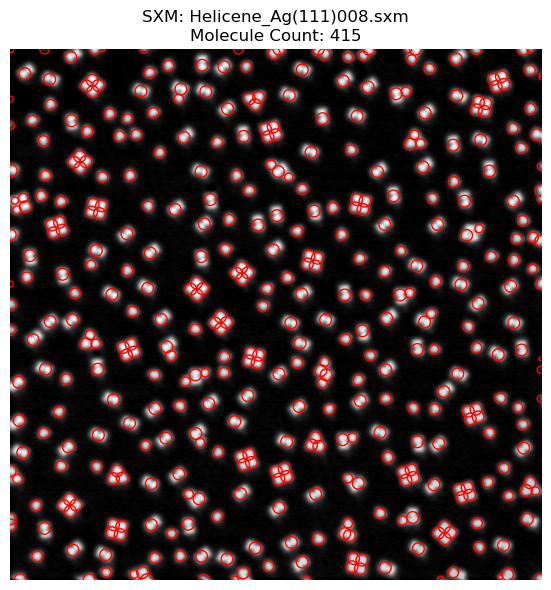

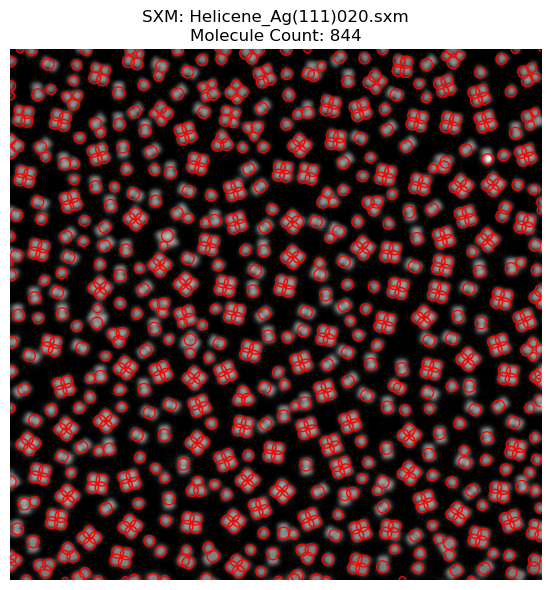

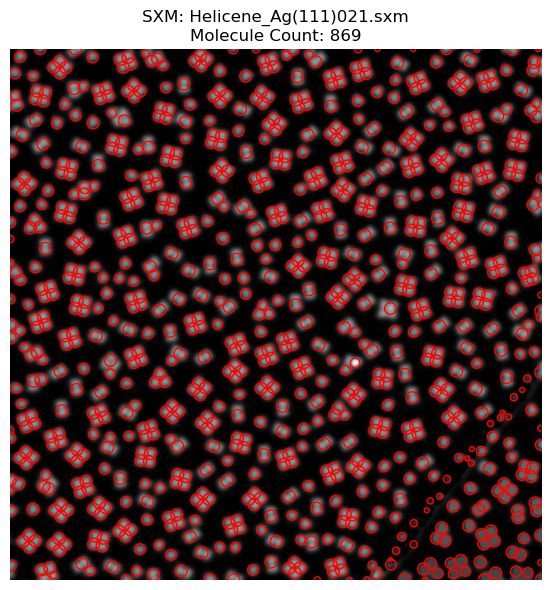

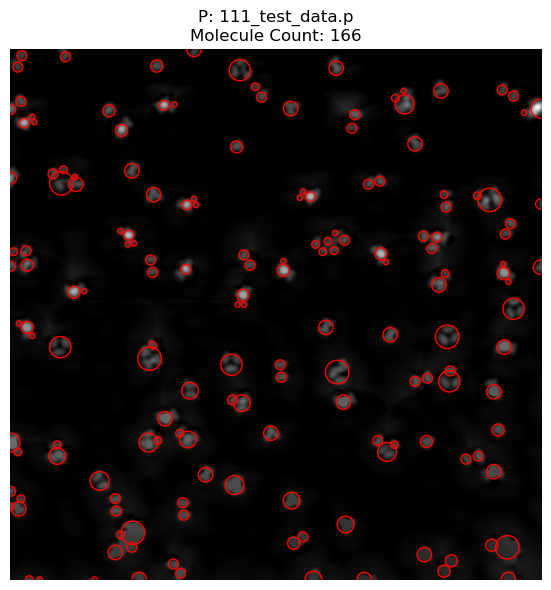

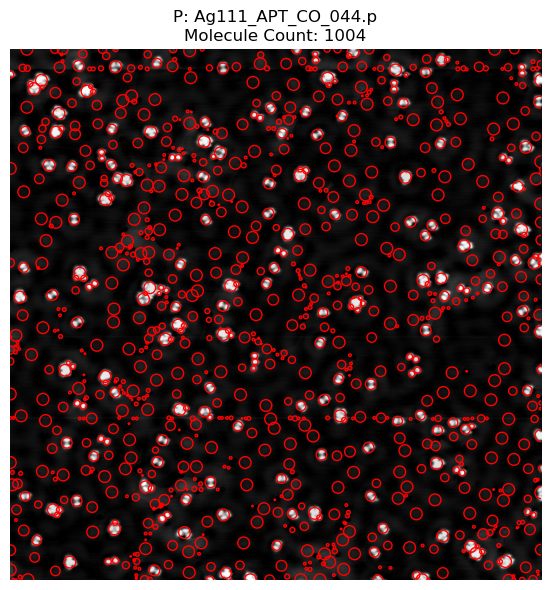

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
from skimage.feature import blob_log
from skimage.filters import gaussian
from skimage.morphology import white_tophat, disk
from skimage.color import rgb2gray

# Compatibility fix for NumPy >=1.20 deprecations
np.float = float
np.int = int

# Optional: Check for nanonispy
try:
    import nanonispy as nap
except ImportError:
    print("Please install nanonispy using: pip install nanonispy")

# === Paths ===
SXM_DIR = r'C:\Users\erlin\Downloads\ADS 2002\SXM files'
P_DIR = r'C:\Users\erlin\Downloads\ADS 2002\P files'

# === File Listing ===
sxm_files = [f for f in os.listdir(SXM_DIR) if f.endswith('.sxm')]
p_files = [f for f in os.listdir(P_DIR) if f.endswith('.p')]

# === Loaders ===
def load_sxm(filepath):
    scan = nap.read.Scan(filepath)
    image = scan.signals['Z']['forward']
    if scan.header.get('scan_dir', '') == 'down':
        image = np.flipud(image)
    image[np.isnan(image)] = np.nanmean(image)
    return image, scan.header.get('scan_range', 1) / scan.header.get('scan_pixels', 1)

def load_p_file(filepath):
    with open(filepath, 'rb') as f:
        data = pickle.load(f)
    return data['image'], data.get('rescale', 1)

# === Preprocessing: normalize background ===
def normalize_background(img, radius=30):
    selem = disk(radius)
    return white_tophat(img, selem)

def preprocess_image(img, sigma=1):
    img = gaussian(img, sigma=sigma)
    vmin, vmax = np.percentile(img, [1, 99])
    img = np.clip(img, vmin, vmax)
    img = (img - vmin) / (vmax - vmin)
    img = normalize_background(img)
    return img

# === Blob Detection ===
def count_molecules(img, min_sigma=1, max_sigma=8, threshold=0.02):
    blobs = blob_log(img, min_sigma=min_sigma, max_sigma=max_sigma, threshold=threshold)
    return blobs

# === Visualizer ===
def show_detection(img, blobs, title=''):
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(img, cmap='gray')
    for y, x, r in blobs:
        circ = plt.Circle((x, y), r * np.sqrt(2), color='red', fill=False, linewidth=1)
        ax.add_patch(circ)
    ax.set_title(f"{title}\nMolecule Count: {len(blobs)}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# === Process all files ===
def process_files(file_list, base_dir, loader, filetype='SXM'):
    for fname in file_list:
        path = os.path.join(base_dir, fname)
        try:
            img, _ = loader(path)
            pre_img = preprocess_image(img)
            blobs = count_molecules(pre_img)
            show_detection(pre_img, blobs, title=f"{filetype}: {fname}")
        except Exception as e:
            print(f"[{filetype}] Error with {fname}: {e}")

# === Run ===
process_files(sxm_files, SXM_DIR, load_sxm, filetype='SXM')
process_files(p_files, P_DIR, load_p_file, filetype='P')


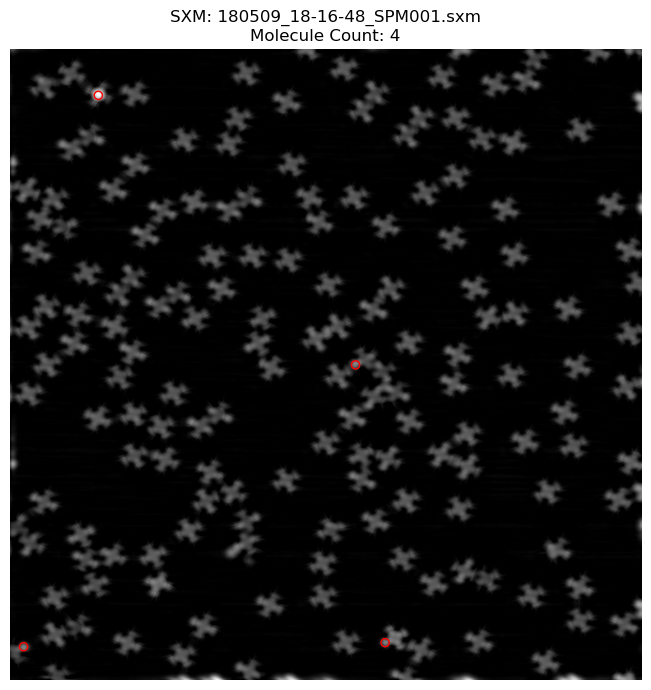

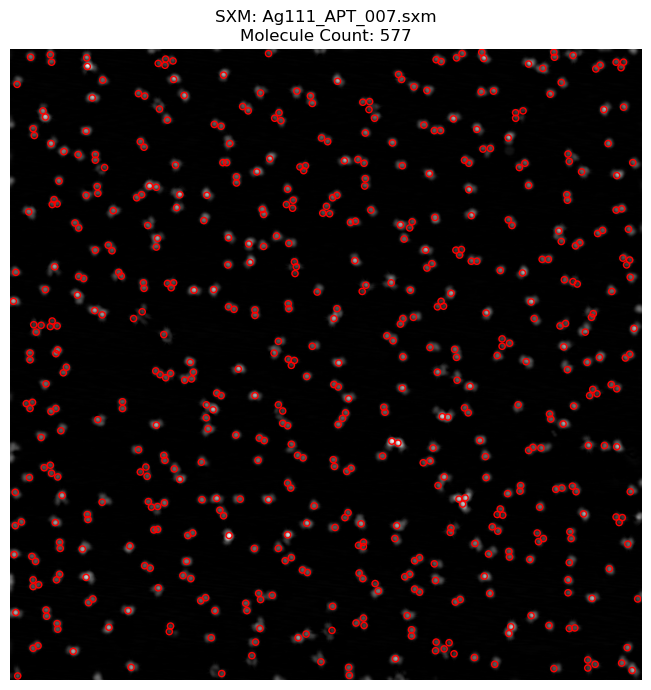

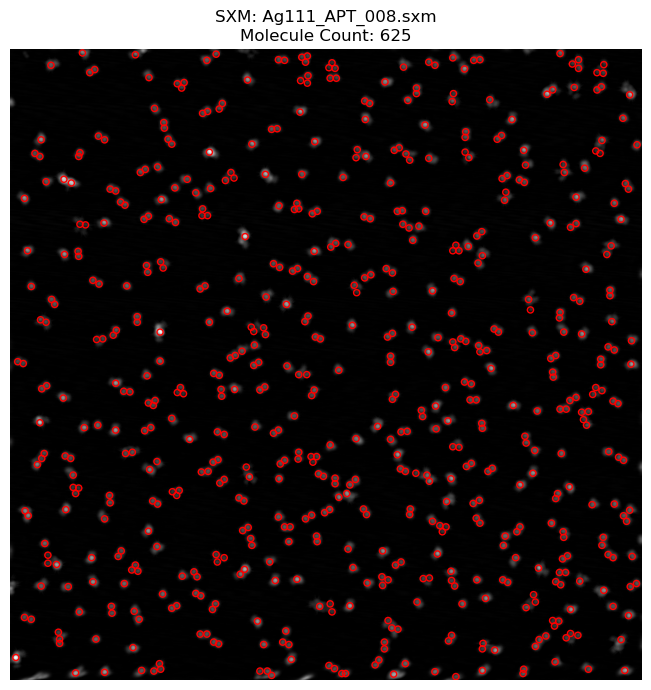

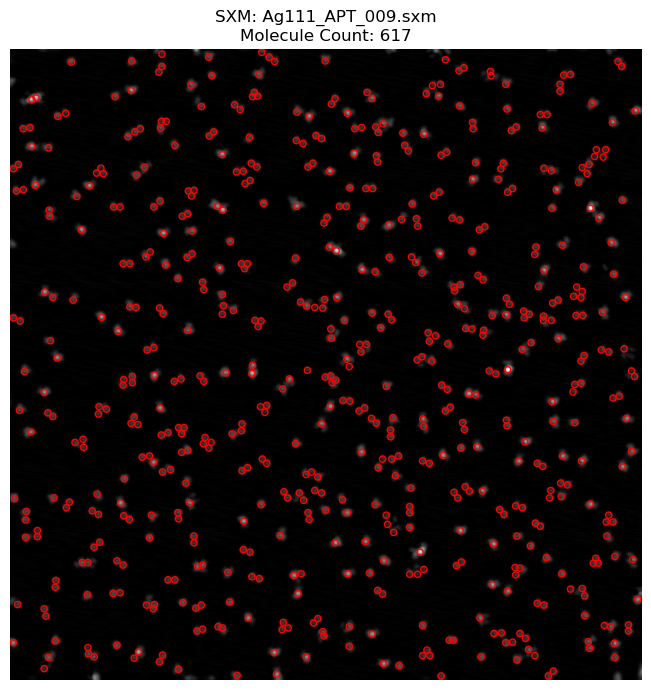

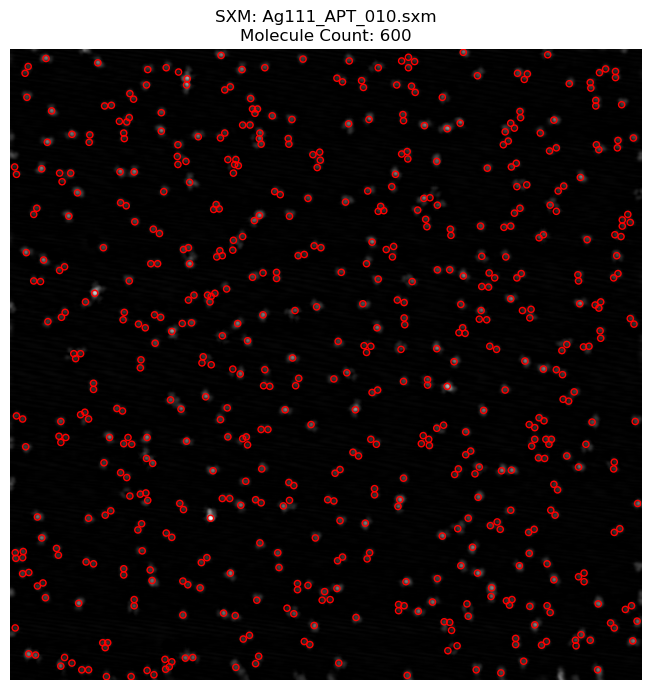

...

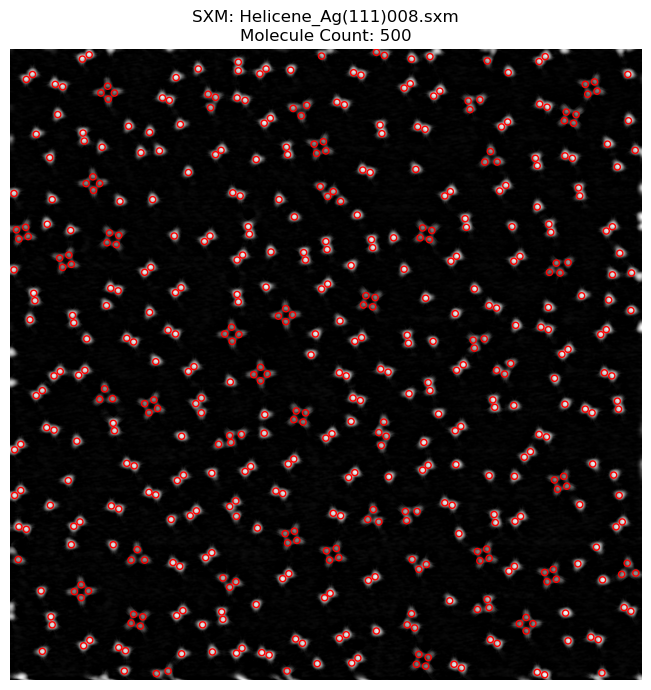

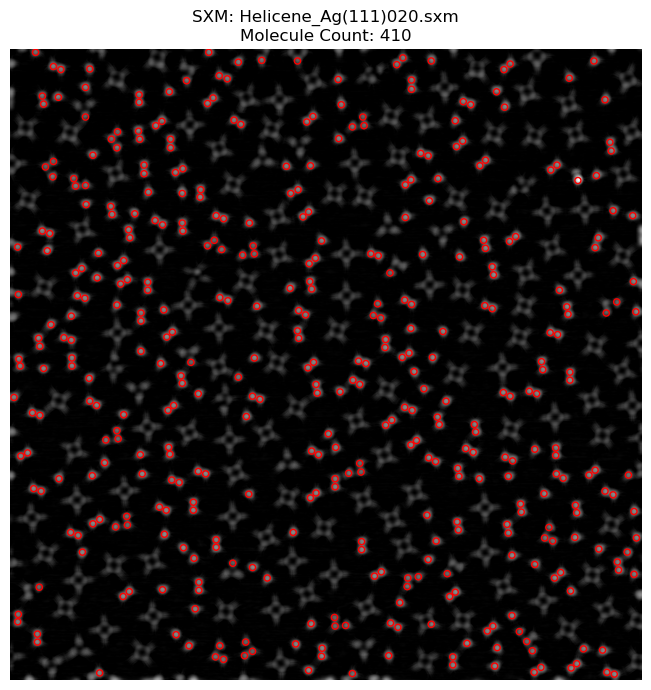

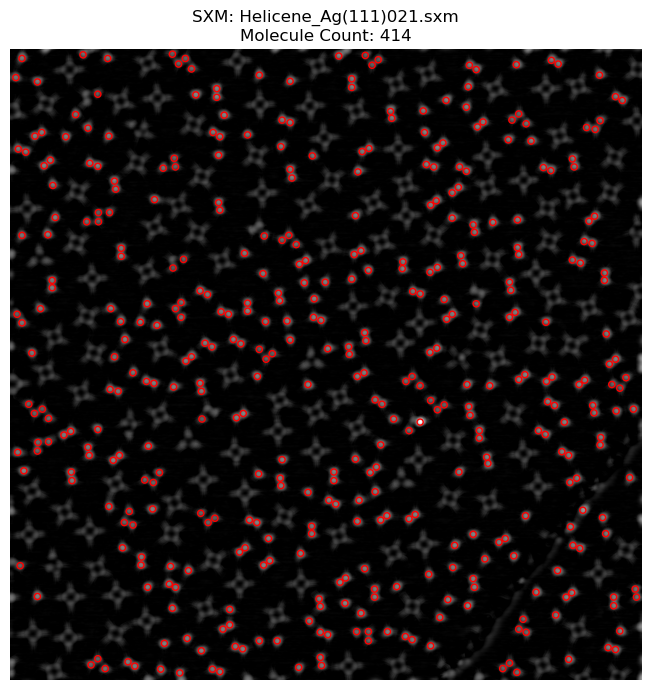

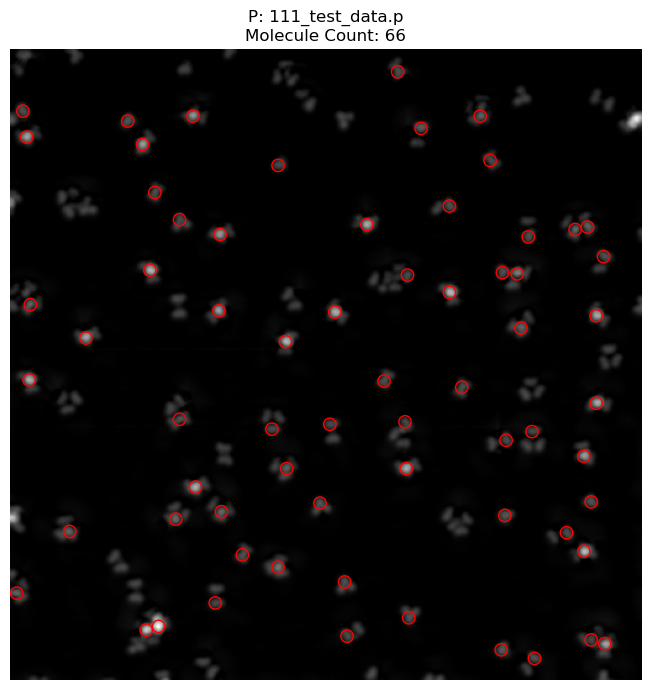

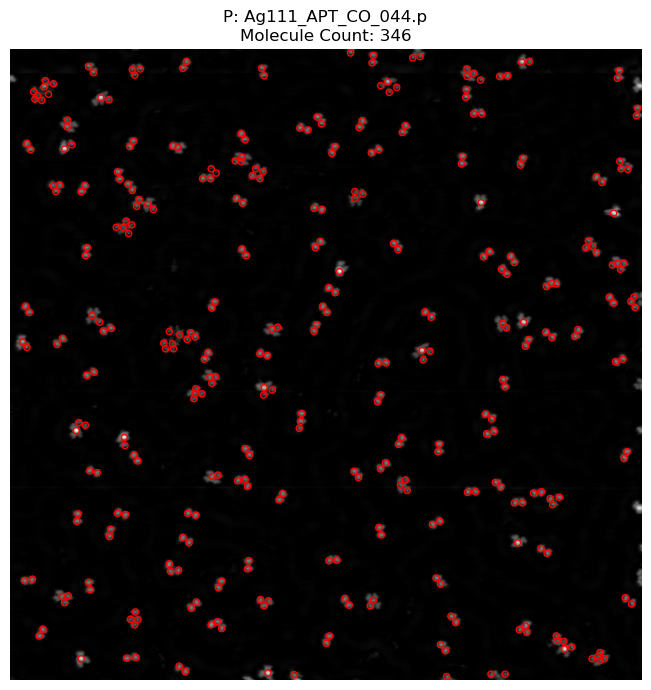

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.morphology import white_tophat, disk
from skimage.feature import peak_local_max
import pickle

# Fix deprecated np types
np.float = float
np.int = int

try:
    import nanonispy as nap
except ImportError:
    print("Install nanonispy: pip install nanonispy")

# === Config Paths ===
SXM_DIR = r'C:\Users\erlin\Downloads\ADS 2002\SXM files'
P_DIR = r'C:\Users\erlin\Downloads\ADS 2002\P files'

# === Loader Functions ===
def load_sxm(filepath):
    scan = nap.read.Scan(filepath)
    image = scan.signals['Z']['forward']
    if scan.header.get('scan_dir', '') == 'down':
        image = np.flipud(image)
    image[np.isnan(image)] = np.nanmean(image)
    return image, scan.header.get('scan_range', 1) / scan.header.get('scan_pixels', 1)

def load_p(filepath):
    with open(filepath, 'rb') as f:
        data = pickle.load(f)
    image = data['image']
    rescale = data.get('rescale', 1)
    return image, rescale

# === Image Processing ===
def preprocess_image(image, sigma=1, tophat_radius=10):
    blurred = gaussian_filter(image, sigma=sigma)
    norm = (blurred - blurred.min()) / (blurred.max() - blurred.min())
    background = white_tophat(norm, disk(tophat_radius))
    return background

# === Molecule Detection ===
def count_molecules(image, threshold_abs=0.1, min_distance=5):
    coords = peak_local_max(image, min_distance=min_distance, threshold_abs=threshold_abs)
    return coords

# === Visualizer ===
def visualize_molecules(image, coords, title):
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(image, cmap='gray')
    for y, x in coords:
        circ = plt.Circle((x, y), radius=5, color='red', fill=False, linewidth=1)
        ax.add_patch(circ)
    ax.set_title(f"{title}\nMolecule Count: {len(coords)}", fontsize=12)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# === Main Automation ===
def process_all_images():
    files = []
    for fname in os.listdir(SXM_DIR):
        if fname.endswith('.sxm'):
            path = os.path.join(SXM_DIR, fname)
            try:
                img, _ = load_sxm(path)
                files.append(('SXM', fname, img))
            except Exception as e:
                print(f"[SXM ERROR] {fname}: {e}")

    for fname in os.listdir(P_DIR):
        if fname.endswith('.p'):
            path = os.path.join(P_DIR, fname)
            try:
                img, _ = load_p(path)
                files.append(('P', fname, img))
            except Exception as e:
                print(f"[P ERROR] {fname}: {e}")

    for ftype, fname, img in files:
        pre = preprocess_image(img)
        coords = count_molecules(pre)
        visualize_molecules(pre, coords, f"{ftype}: {fname}")

# === Run ===
process_all_images()


C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


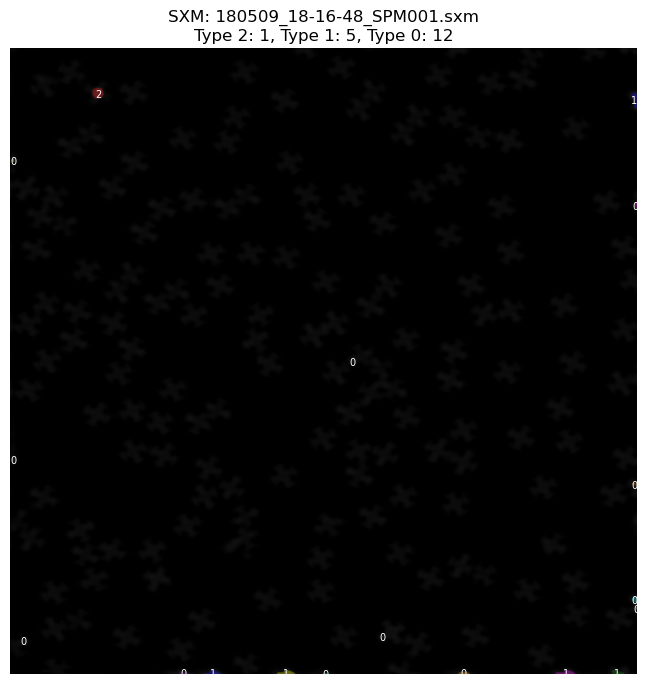

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


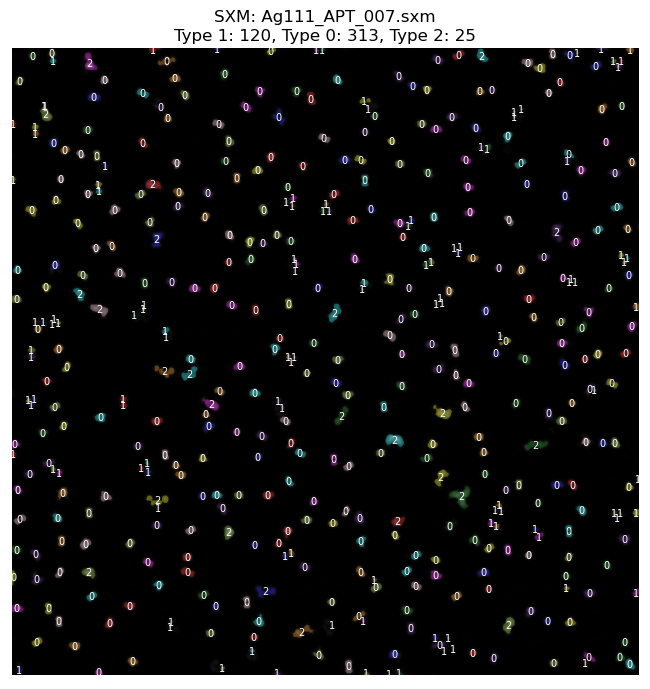

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


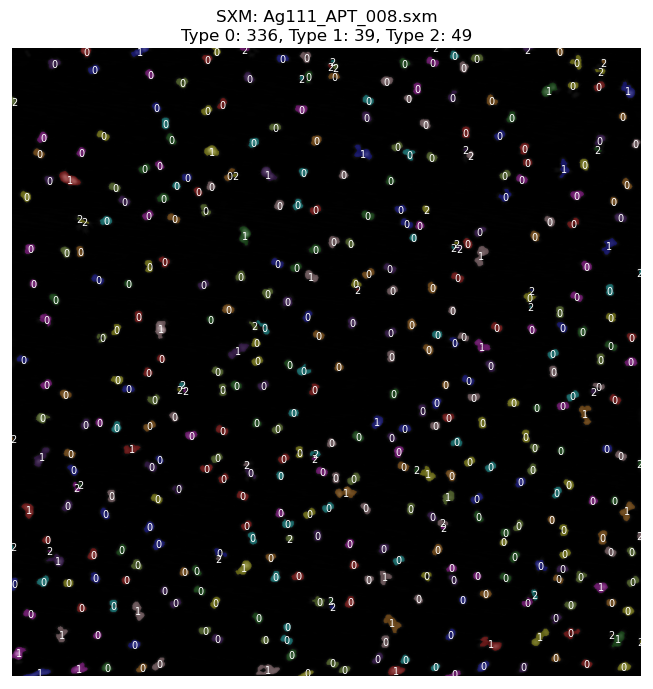

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


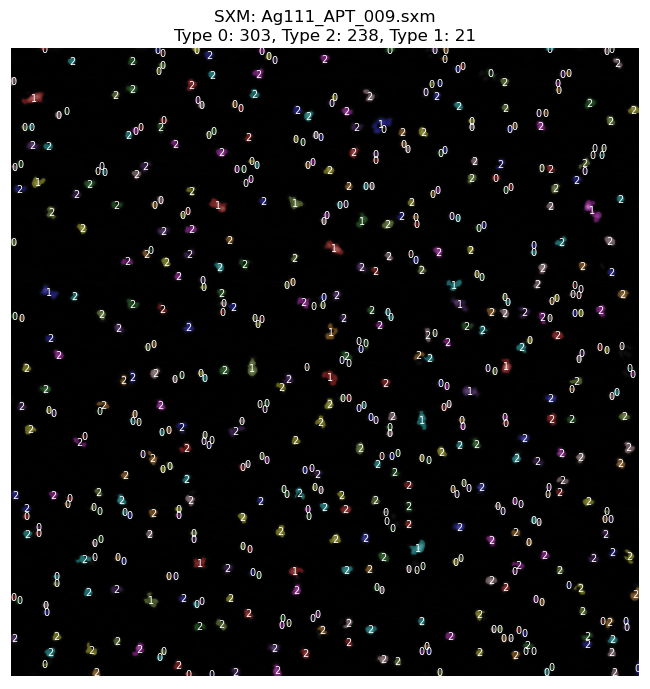

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


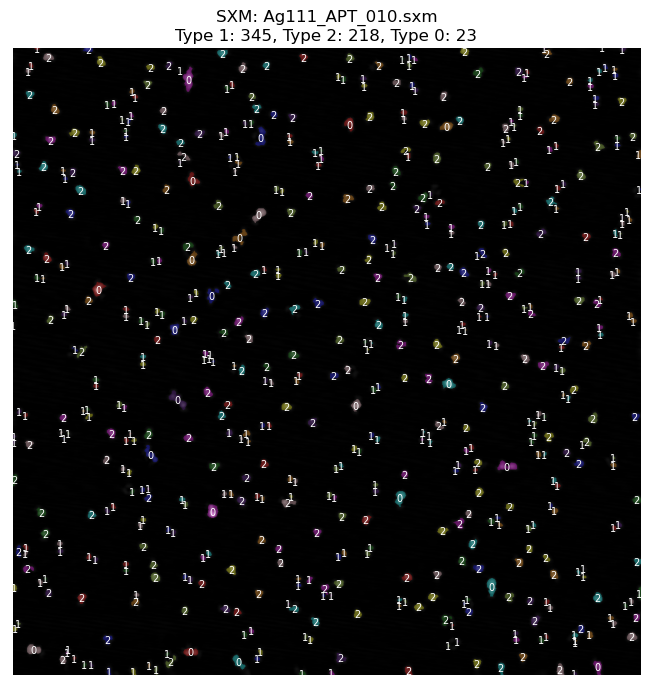

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


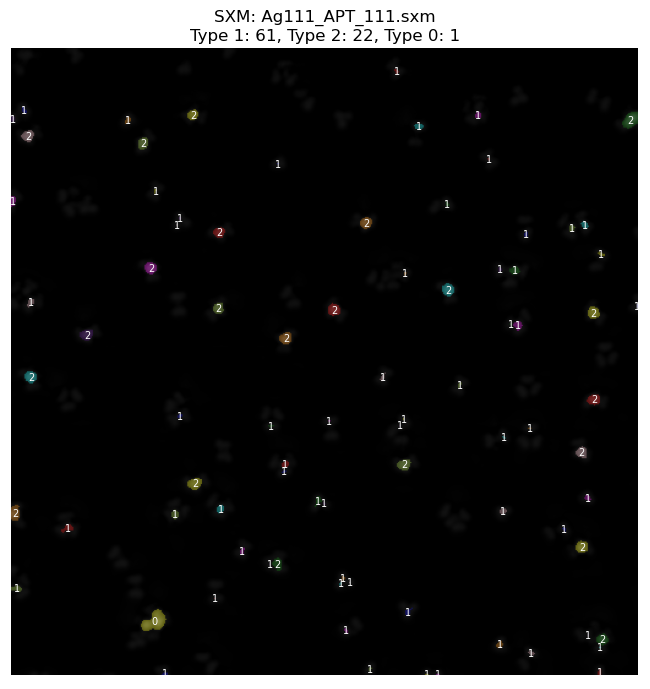

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


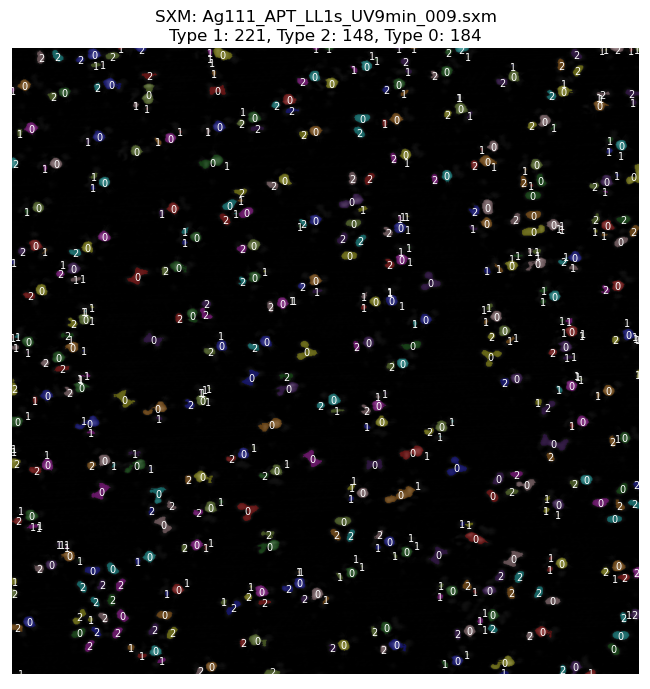

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


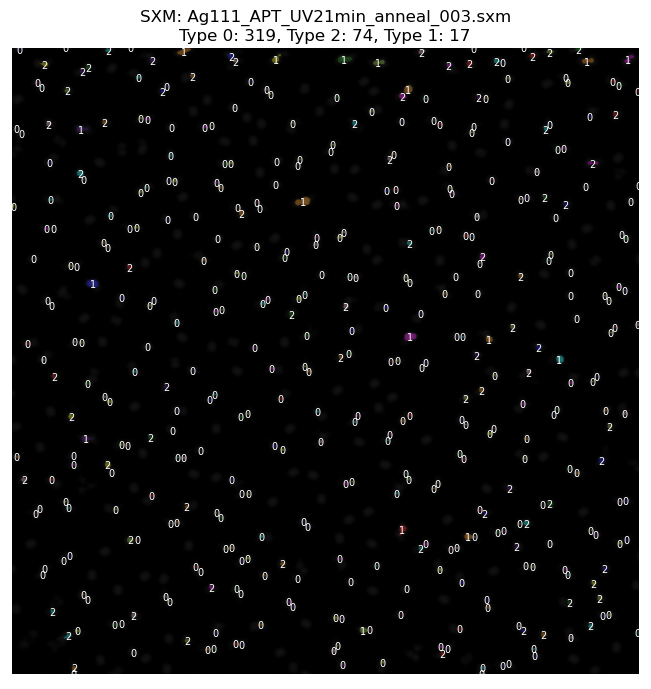

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


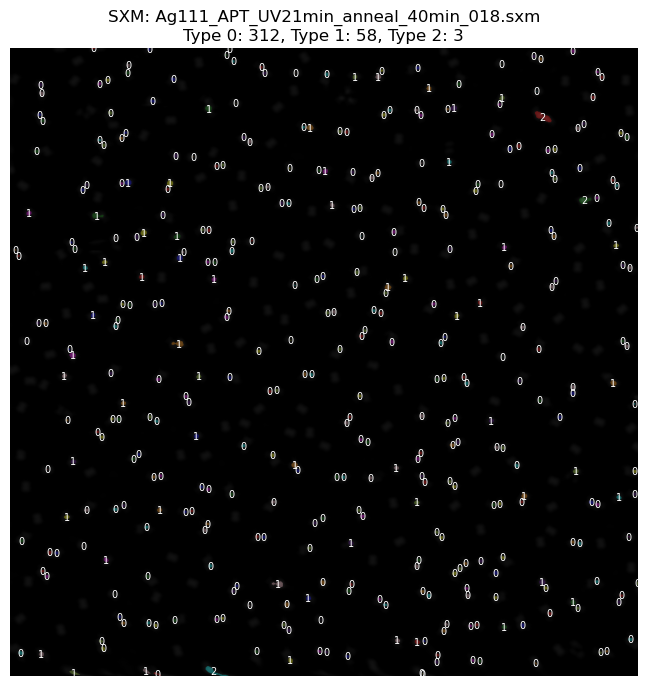

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


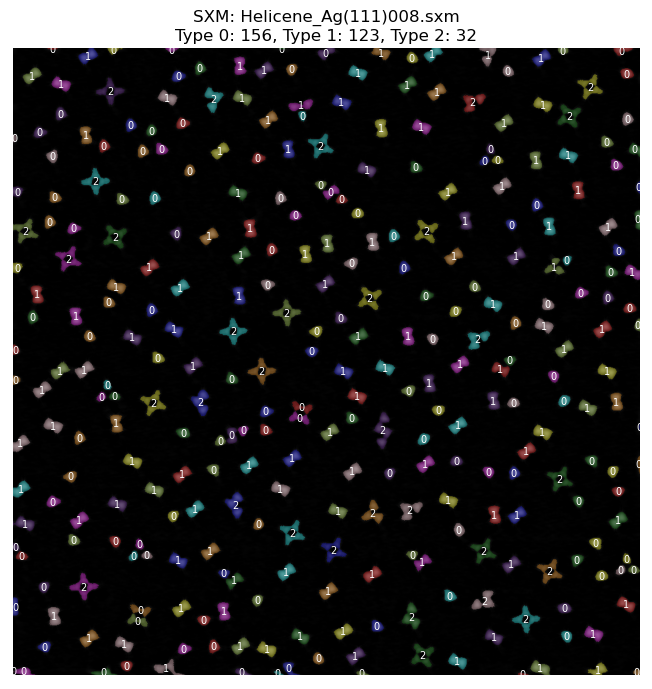

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


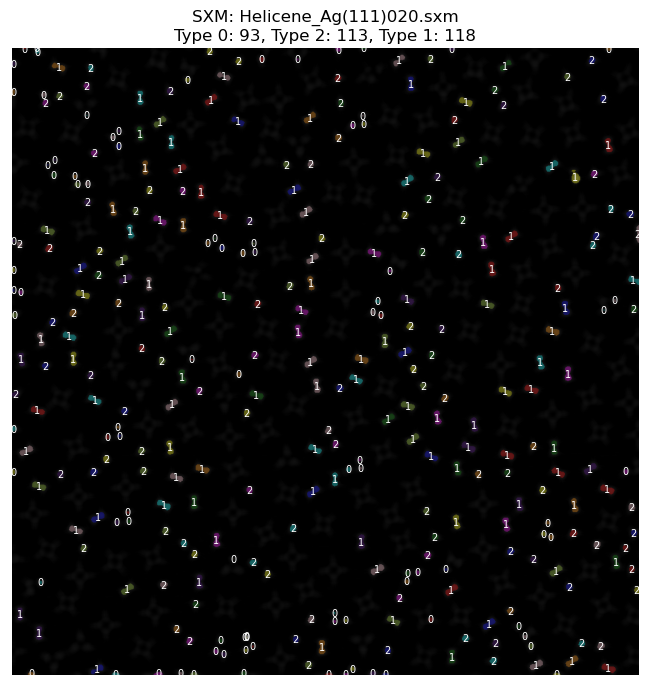

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


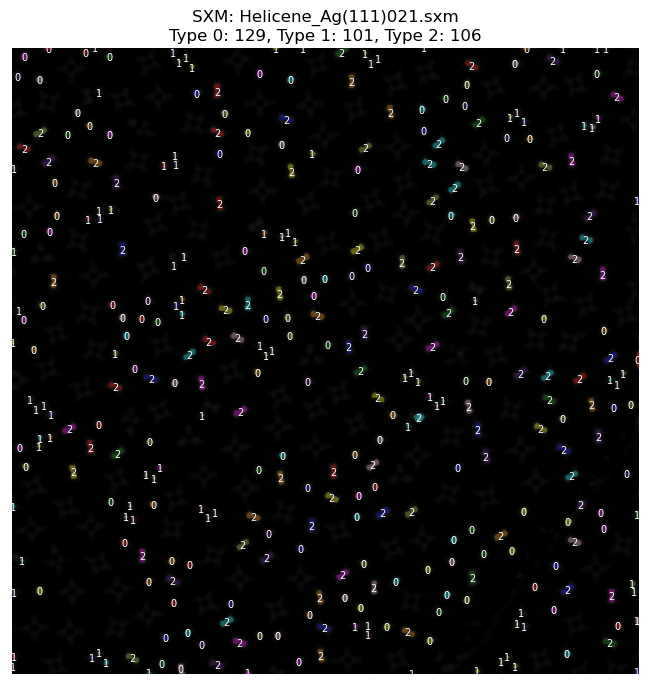

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


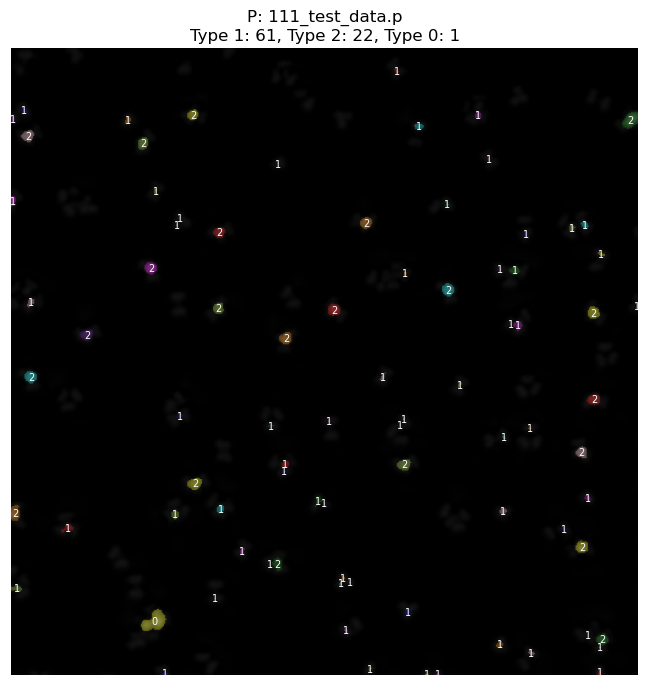

C:\Users\erlin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


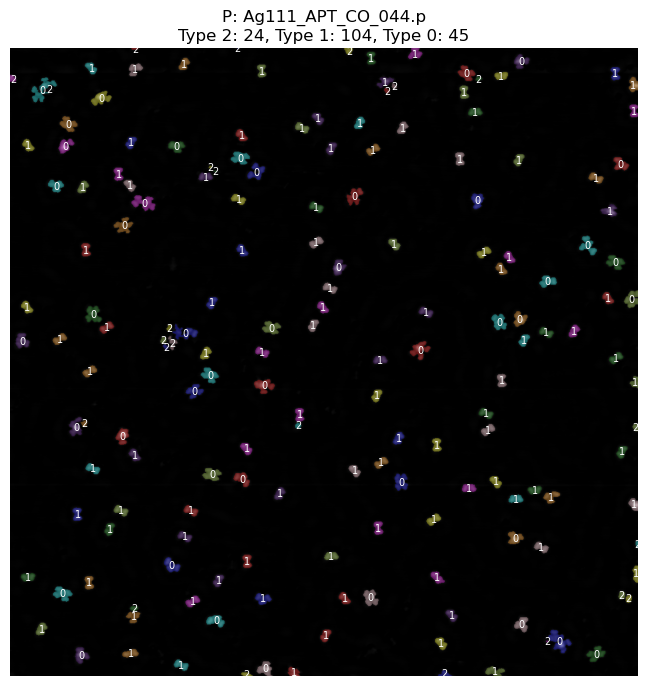

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.morphology import white_tophat, disk
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from skimage.color import label2rgb
import pickle

# Fix deprecated np types
np.float = float
np.int = int

try:
    import nanonispy as nap
except ImportError:
    print("Install nanonispy: pip install nanonispy")

# === Config Paths ===
SXM_DIR = r'C:\Users\erlin\Downloads\ADS 2002\SXM files'
P_DIR = r'C:\Users\erlin\Downloads\ADS 2002\P files'

# === Loader Functions ===
def load_sxm(filepath):
    scan = nap.read.Scan(filepath)
    image = scan.signals['Z']['forward']
    if scan.header.get('scan_dir', '') == 'down':
        image = np.flipud(image)
    image[np.isnan(image)] = np.nanmean(image)
    return image, scan.header.get('scan_range', 1) / scan.header.get('scan_pixels', 1)

def load_p(filepath):
    with open(filepath, 'rb') as f:
        data = pickle.load(f)
    image = data['image']
    rescale = data.get('rescale', 1)
    return image, rescale

# === Image Preprocessing ===
def preprocess_image(image, sigma=1, tophat_radius=10):
    blurred = gaussian_filter(image, sigma=sigma)
    norm = (blurred - blurred.min()) / (blurred.max() - blurred.min())
    background = white_tophat(norm, disk(tophat_radius))
    return background

# === Molecule Classification ===
def classify_molecules(binary_img, n_clusters=3):
    labeled = label(binary_img)
    props = regionprops(labeled)

    # Extract area and eccentricity
    features = np.array([[p.area, p.eccentricity] for p in props])
    if len(features) < n_clusters:
        print("Not enough features to classify.")
        return labeled, props, None

    kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
    labels = kmeans.fit_predict(features)

    # Attach classification info
    molecule_info = []
    for i, p in enumerate(props):
        molecule_info.append({
            'label': i+1,
            'area': p.area,
            'eccentricity': p.eccentricity,
            'centroid': p.centroid,
            'cluster': labels[i]
        })

    return labeled, molecule_info, kmeans

# === Visualizer with Classification ===
def visualize_classified(image, labeled_img, molecule_info, title):
    overlay = label2rgb(labeled_img, image=image, bg_label=0)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(overlay)
    cluster_counts = {}

    for mol in molecule_info:
        y, x = mol['centroid']
        cluster = mol['cluster']
        cluster_counts[cluster] = cluster_counts.get(cluster, 0) + 1
        ax.text(x, y, str(cluster), color='white', fontsize=7, ha='center', va='center')

    # Build cluster count text
    count_info = ", ".join([f"Type {k}: {v}" for k, v in cluster_counts.items()])
    ax.set_title(f"{title}\n{count_info}", fontsize=12)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# === Main Automation ===
def process_all_images():
    files = []
    for fname in os.listdir(SXM_DIR):
        if fname.endswith('.sxm'):
            path = os.path.join(SXM_DIR, fname)
            try:
                img, _ = load_sxm(path)
                files.append(('SXM', fname, img))
            except Exception as e:
                print(f"[SXM ERROR] {fname}: {e}")

    for fname in os.listdir(P_DIR):
        if fname.endswith('.p'):
            path = os.path.join(P_DIR, fname)
            try:
                img, _ = load_p(path)
                files.append(('P', fname, img))
            except Exception as e:
                print(f"[P ERROR] {fname}: {e}")

    for ftype, fname, img in files:
        pre = preprocess_image(img)
        binary = pre > 0.1  # threshold for binarization, adjust if needed
        labeled, mol_info, kmeans = classify_molecules(binary, n_clusters=3)

        if mol_info:
            visualize_classified(pre, labeled, mol_info, f"{ftype}: {fname}")

# === Run ===
process_all_images()


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.morphology import white_tophat, disk
from skimage.feature import peak_local_max
import pickle
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# === Compatibility Fix ===
np.float = float
np.int = int

# === Optional Dependency ===
try:
    import nanonispy as nap
except ImportError:
    print("Install nanonispy: pip install nanonispy")

# === Paths ===
SXM_DIR = r'C:\Users\erlin\Downloads\ADS 2002\SXM files'
P_DIR = r'C:\Users\erlin\Downloads\ADS 2002\P files'

# === Loaders ===
def load_sxm(filepath):
    scan = nap.read.Scan(filepath)
    image = scan.signals['Z']['forward']
    if scan.header.get('scan_dir', '') == 'down':
        image = np.flipud(image)
    image[np.isnan(image)] = np.nanmean(image)
    return image, scan.header.get('scan_range', 1) / scan.header.get('scan_pixels', 1)

def load_p(filepath):
    with open(filepath, 'rb') as f:
        data = pickle.load(f)
    return data['image'], data.get('rescale', 1)

# === Image Preprocessing ===
def preprocess_image(image, sigma=1, tophat_radius=10):
    blurred = gaussian_filter(image, sigma=sigma)
    norm = (blurred - blurred.min()) / (blurred.max() - blurred.min())
    background = white_tophat(norm, disk(tophat_radius))
    return background

# === Molecule Detection ===
def detect_molecules(image, threshold_abs=0.1, min_distance=5):
    return peak_local_max(image, min_distance=min_distance, threshold_abs=threshold_abs)

# === Molecule Classification (Uncapped Types) ===
def classify_molecules_auto(binary_img, max_clusters=10):
    coords = np.column_stack(np.nonzero(binary_img))
    if len(coords) < 2:
        return np.zeros_like(binary_img), coords, np.array([]), 0

    scaled_coords = StandardScaler().fit_transform(coords)

    best_k = 2
    best_score = -1
    best_labels = None

    for k in range(2, min(max_clusters, len(coords))):
        kmeans = KMeans(n_clusters=k, random_state=0)
        labels = kmeans.fit_predict(scaled_coords)
        score = silhouette_score(scaled_coords, labels)
        if score > best_score:
            best_k = k
            best_score = score
            best_labels = labels

    labeled_img = np.zeros_like(binary_img, dtype=int)
    for (y, x), label in zip(coords, best_labels):
        labeled_img[y, x] = label + 1

    return labeled_img, coords, best_labels, best_k

# === Visualizer ===
def visualize_classified(image, coords, labels, title):
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(image, cmap='gray')
    if labels is not None:
        for (y, x), label in zip(coords, labels):
            color = plt.cm.tab10(label % 10)
            circ = plt.Circle((x, y), radius=4, color=color, fill=False, linewidth=1)
            ax.add_patch(circ)
    ax.set_title(f"{title}\nDetected Molecules: {len(coords)} | Types: {len(set(labels)) if labels is not None else 0}")
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# === Main Processor ===
def process_all_images():
    files = []

    for fname in os.listdir(SXM_DIR):
        if fname.endswith('.sxm'):
            path = os.path.join(SXM_DIR, fname)
            try:
                img, _ = load_sxm(path)
                files.append(('SXM', fname, img))
            except Exception as e:
                print(f"[SXM ERROR] {fname}: {e}")

    for fname in os.listdir(P_DIR):
        if fname.endswith('.p'):
            path = os.path.join(P_DIR, fname)
            try:
                img, _ = load_p(path)
                files.append(('P', fname, img))
            except Exception as e:
                print(f"[P ERROR] {fname}: {e}")

    for ftype, fname, img in files:
        pre = preprocess_image(img)
        coords = detect_molecules(pre)
        binary = np.zeros_like(pre, dtype=bool)
        for y, x in coords:
            binary[y, x] = 1
        labeled, coords, labels, n_clusters = classify_molecules_auto(binary)
        visualize_classified(pre, coords, labels, f"{ftype}: {fname}")
        print(f"{ftype}: {fname} → {len(coords)} molecules in {n_clusters} clusters")

# === Run ===
process_all_images()
